
# Approche 0.0: Détection de visage et organisation spatiale sur images de la video


In [3]:
import numpy as np
import os
import gdown
# Supervision is an open-source toolkit packaging
import supervision as sv
from tqdm.notebook import tqdm
import cv2
#Si vous exécutez le code sur colab c'est une alternative pour imshow de cv2 qui n'y fonctionne pas
from google.colab.patches import cv2_imshow

In [4]:
HOME = os.getcwd()
print(HOME)

/content


In [5]:
VIDEO_DIR_PATH = f"{HOME}/videos"
IMAGE_DIR_PATH = f"{HOME}/images"

In [6]:
!mkdir videos images

In [7]:
# Récupération de la vidéo de google drive
file_id = '1gH8WJqGdUvMLiAnfiLIEFR9c4rOQTBkn'
output_path = f'{VIDEO_DIR_PATH}/corrupted_video.mp4'
gdown.download(f'https://drive.google.com/uc?id={file_id}', output_path, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=1gH8WJqGdUvMLiAnfiLIEFR9c4rOQTBkn
To: /content/videos/corrupted_video.mp4
100%|██████████| 4.84M/4.84M [00:00<00:00, 39.6MB/s]


'/content/videos/corrupted_video.mp4'

In [8]:
#Stock les chemins vers toutes les videos d'un dossier donné ( une seule dans notre cas)
video_paths = sv.list_files_with_extensions(
    directory=VIDEO_DIR_PATH,
    extensions=["mp4"])
#Division de la vidéo en images et enregistrement dans IMAGE_DIR_PATH
video_name = video_paths[0].stem
image_name_pattern = "{:d}.png"
with sv.ImageSink(target_dir_path=IMAGE_DIR_PATH, image_name_pattern=image_name_pattern) as sink:
    for image in sv.get_video_frames_generator(source_path=str(video_paths[0]), stride=4):
        sink.save_image(image=image)

In [9]:
#Stock les chemins vers toutes les images d'un dossier donné
image_paths = sv.list_files_with_extensions(
    directory=IMAGE_DIR_PATH,
    extensions=["png", "jpg", "jpg"])
#Affichage du nombre dd'images ( on peut le varier avec le stride de division plus haut qui affecte les resultats de la restauration finale)
print('image count:', len(image_paths))

image count: 29


In [10]:
#Parametres pour le cadre d'affichage des images obtenues
SAMPLE_SIZE = 23
SAMPLE_GRID_SIZE = (4, 6)
SAMPLE_PLOT_SIZE = (5, 5)

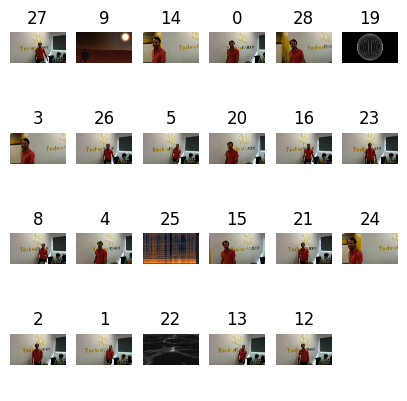

In [11]:
#Affichages des images
titles = [
    image_path.stem
    for image_path
    in image_paths[:SAMPLE_SIZE]]
images = [
    cv2.imread(str(image_path))
    for image_path
    in image_paths[:SAMPLE_SIZE]]

sv.plot_images_grid(images=images, titles=titles, grid_size=SAMPLE_GRID_SIZE, size=SAMPLE_PLOT_SIZE)

On voit bien les images du mouvement initial dérangé et plusieurs images intruses

In [12]:
# Chargement du modèle préentrainé Haarcascades face detector
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')


In [13]:
#Fonction qui utilise le modele pour detecter un visage dans une image donné
def extract_faces(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Detect faces in the image
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=9)

    return faces

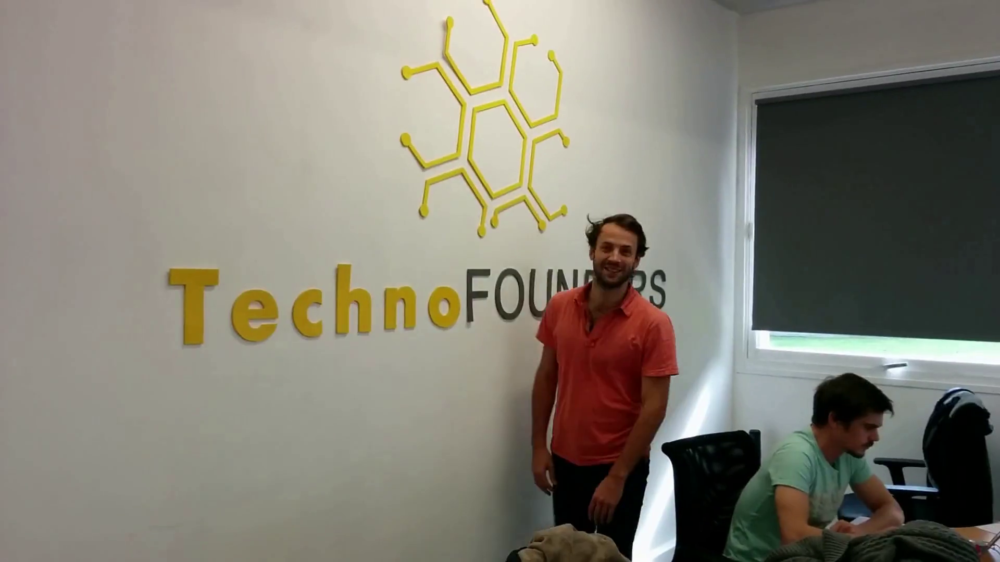

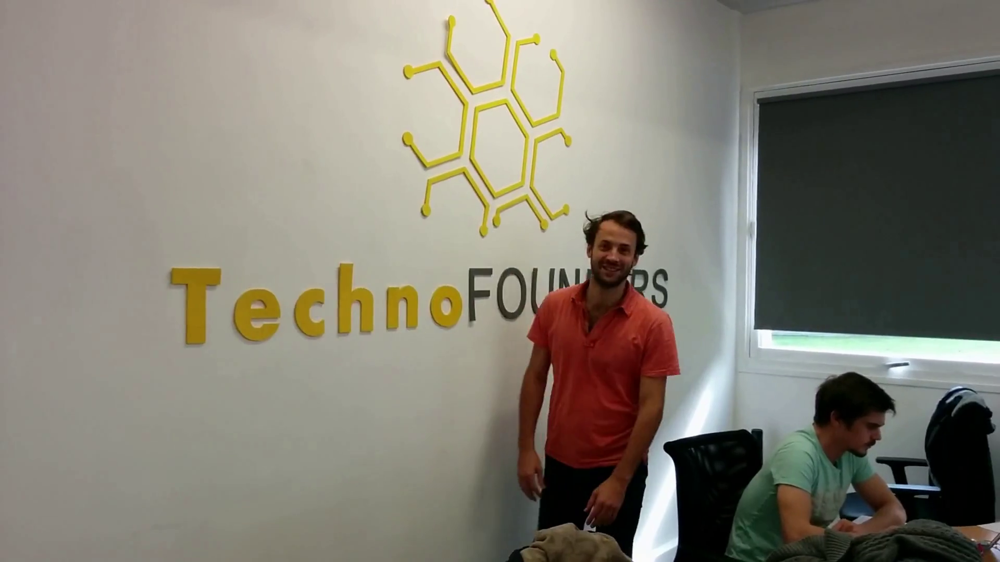

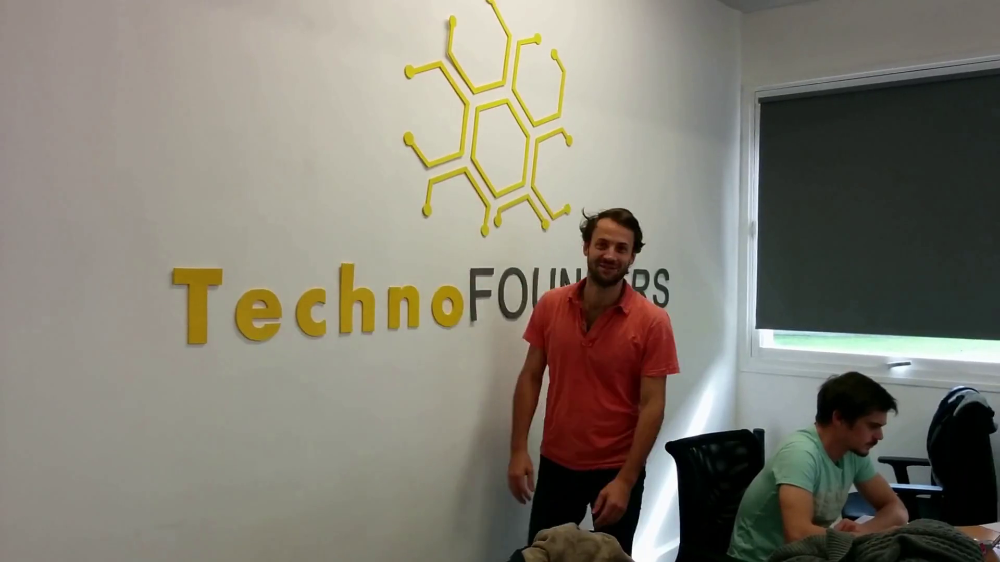

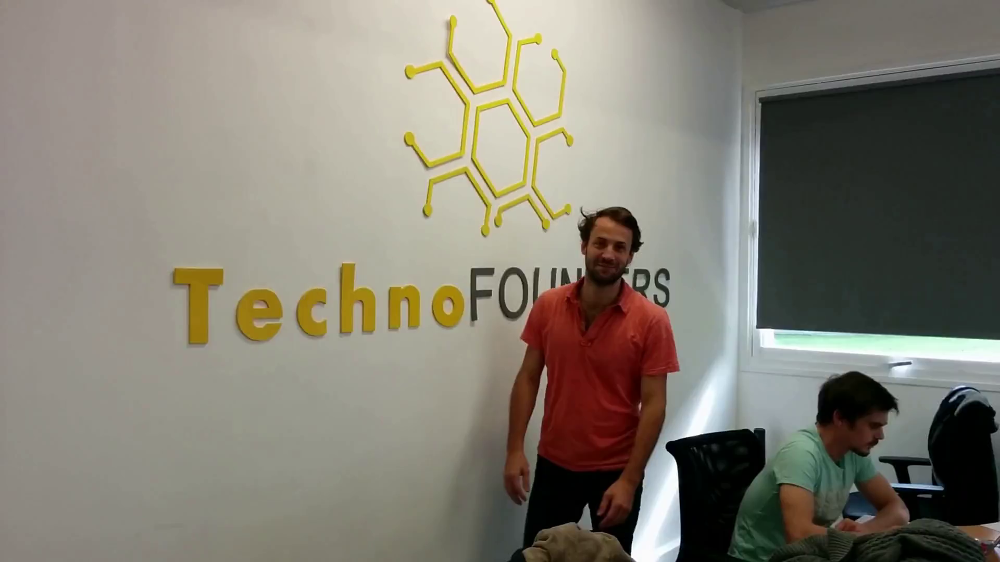

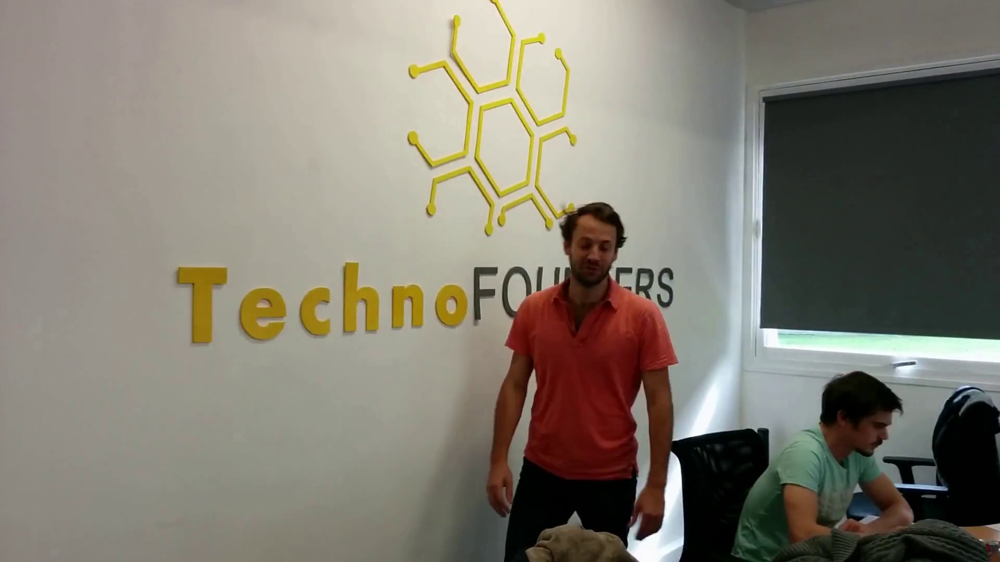

...

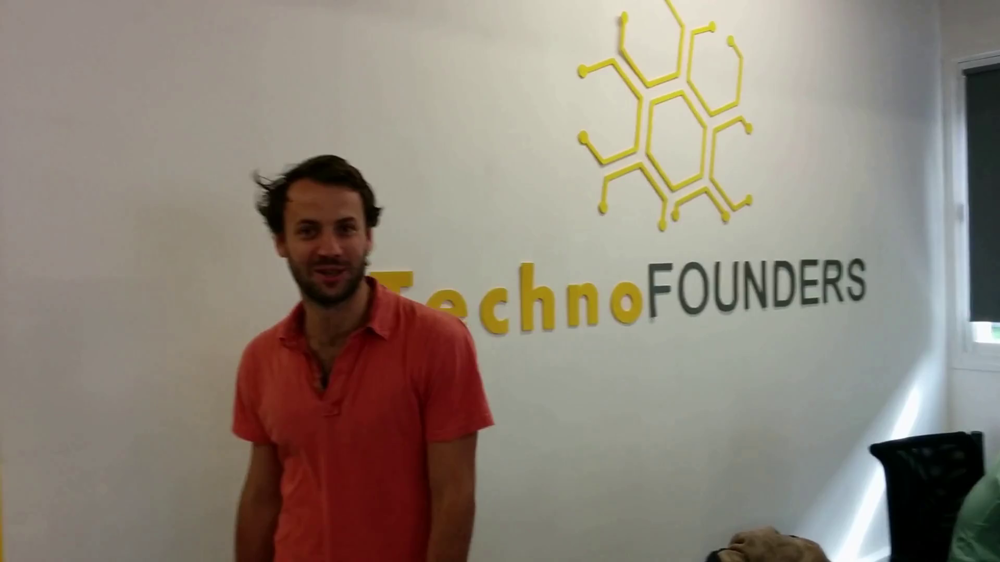

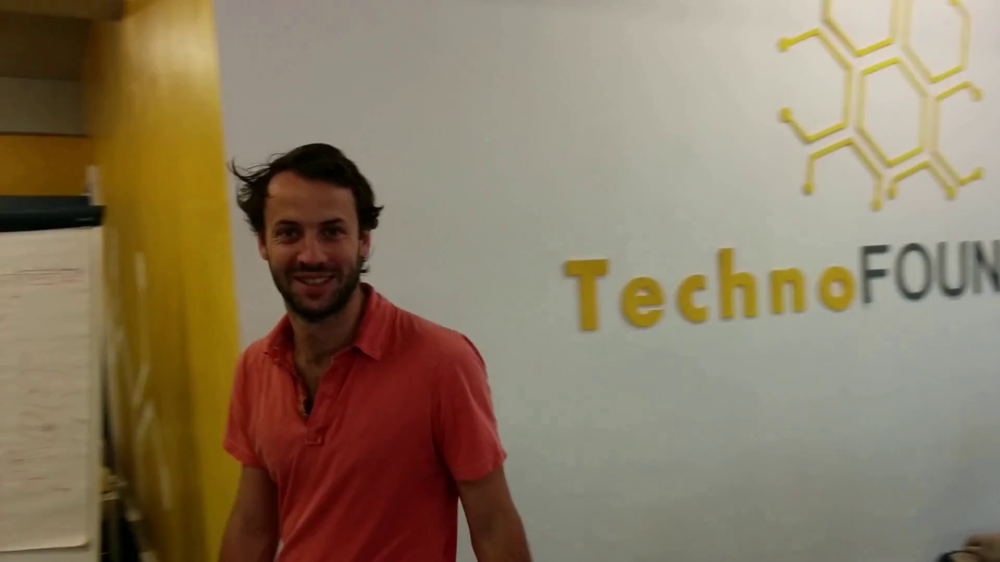

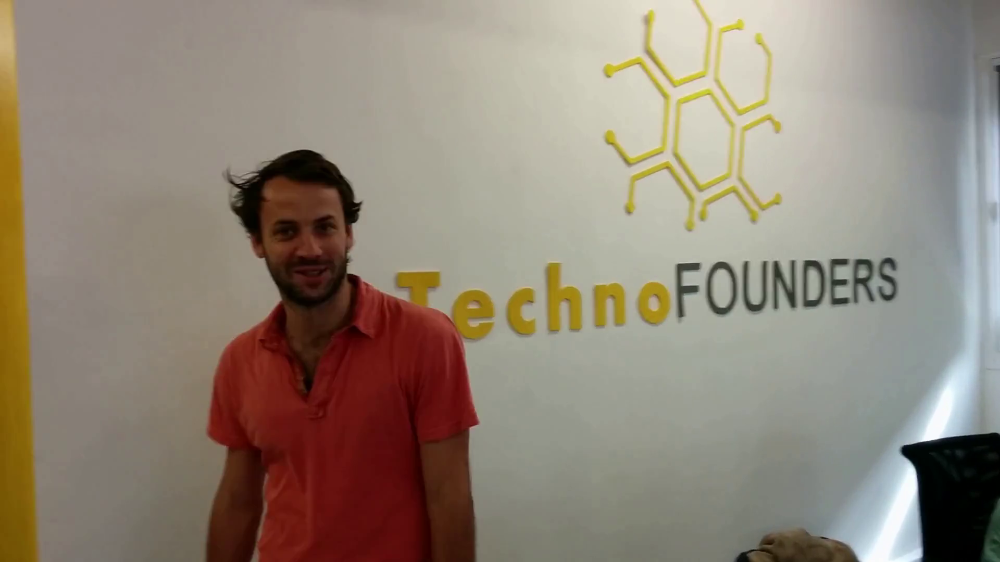

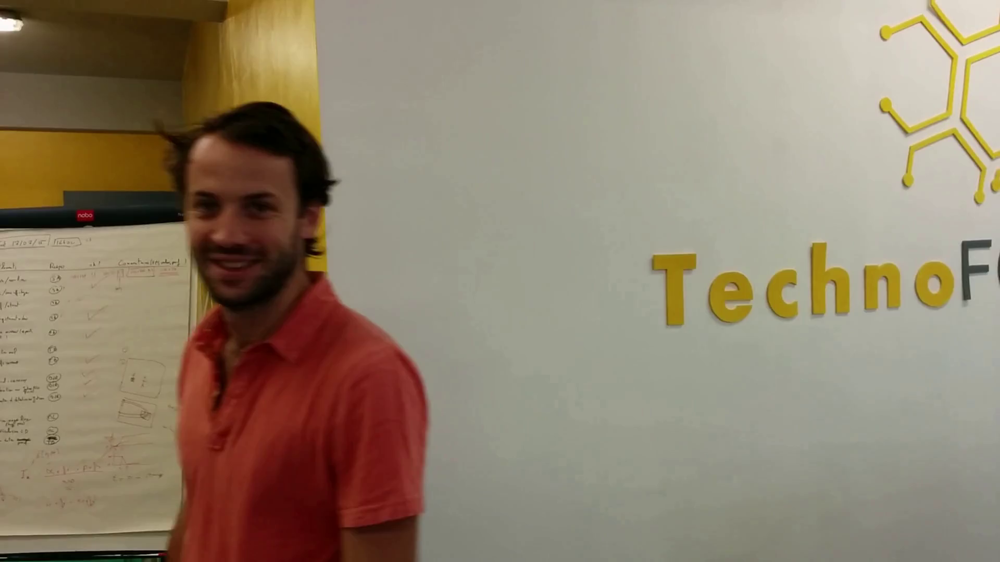

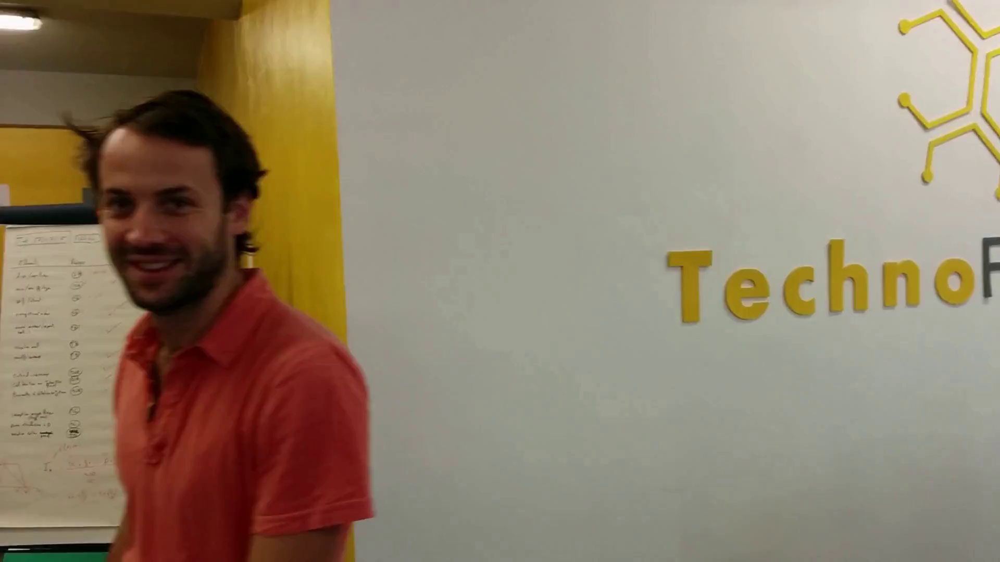

In [14]:
image_files = sorted(os.listdir(IMAGE_DIR_PATH))

# Liste vide qui stockera plutard les position de visage dans chaque image et l'indice qui identifiera ce cadre
sorted_images = []

for image_file in image_files:
    img = cv2.imread(os.path.join(IMAGE_DIR_PATH, image_file))
    faces = extract_faces(img)
    #condition qui permet de filtrer les images sans visage
    if len(faces) > 0:
        #Stockage de l'image et la position du visage qui y est
        sorted_images.append((image_file, faces[0][0]))

# Ordonnancement à base de la position spatiale du visage
sorted_images.sort(key=lambda x: x[1], reverse=True)


# Display the sorted images
for image_file, _ in sorted_images:
    img = cv2.imread(os.path.join(IMAGE_DIR_PATH, image_file))
    cv2_imshow(img)
    cv2.waitKey(0)

cv2.destroyAllWindows()

In [15]:
#lecture d'une premiere image pour initialiser l'objet d'ecriture video
img = cv2.imread(os.path.join(IMAGE_DIR_PATH, os.listdir(IMAGE_DIR_PATH)[0]))
height, width, layers = img.shape
path=f'{VIDEO_DIR_PATH}/output.mp4'
# Creation de l'objet VideoWriter
video = cv2.VideoWriter(path, cv2.VideoWriter_fourcc(*'mp4v'), 7, (width, height))

# Parcours des images ordonnées et écriture dans la nouvelle vidéo de sortie
for image_file, _ in sorted_images:
    img = cv2.imread(os.path.join(IMAGE_DIR_PATH, image_file))
    video.write(img)

# Release the VideoWriter object
video.release()